<a href="https://colab.research.google.com/github/tamanna155/WildFire_Detection/blob/master/Wildfire_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5
!pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17360, done.
remote: Counting objects: 100% (52/52), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 17360 (delta 36), reused 18 (delta 18), pack-reused 17308 (from 2)
Receiving objects: 100% (17360/17360), 16.24 MiB | 11.31 MiB/s, done.
Resolving deltas: 100% (11904/11904), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 71.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 59.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.6 MB/s et

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!cp -r /content/drive/MyDrive/wildfire_dataset /content/yolov5/data/

In [4]:
wildfire_yaml = """
train: /content/yolov5/data/wildfire_dataset/train/images
val: /content/yolov5/data/wildfire_dataset/val/images
test: /content/yolov5/data/wildfire_dataset/test/images
nc: 2
names: ['fire','smoke']
"""

with open("data/wildfire.yaml", "w") as file:
    file.write(wildfire_yaml)


In [5]:
!python train.py --img 640 --batch 16 --epochs 80 --data data/wildfire.yaml --weights yolov5s.pt --device 0


Streaming output truncated to the last 5000 lines.
      65/79      4.52G    0.03163    0.02176   0.001049         61        640:  55% 93/170 [00:33<00:28,  2.71it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      65/79      4.52G     0.0316    0.02172   0.001041         50        640:  55% 94/170 [00:33<00:25,  2.99it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      65/79      4.52G    0.03159    0.02171   0.001056         54        640:  56% 95/170 [00:33<00:23,  3.25it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      65/79      4.52G    0.03157 

In [6]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [8]:
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images

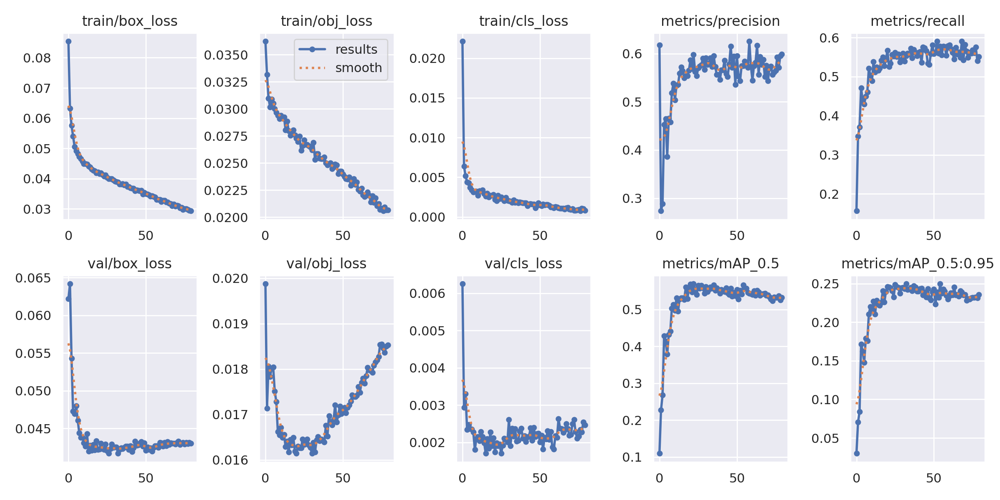

In [11]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/exp/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


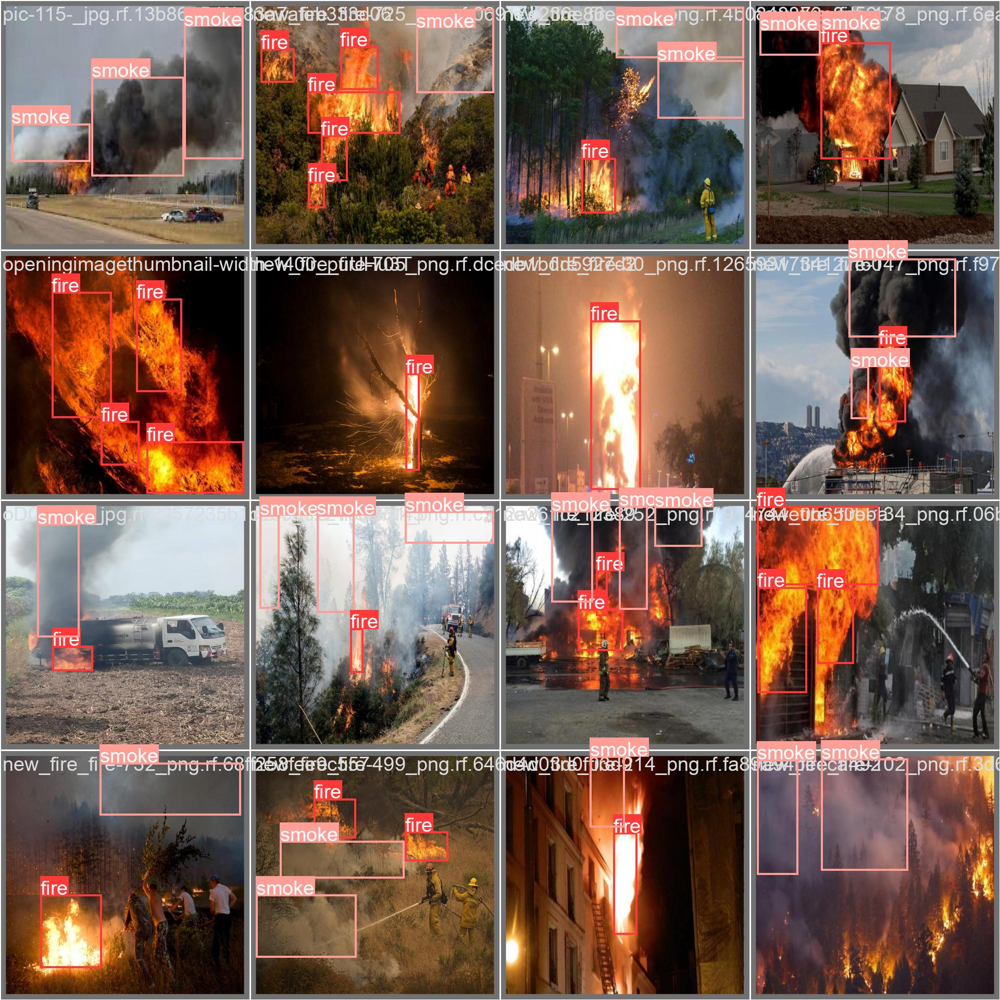

In [12]:
#first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/exp/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


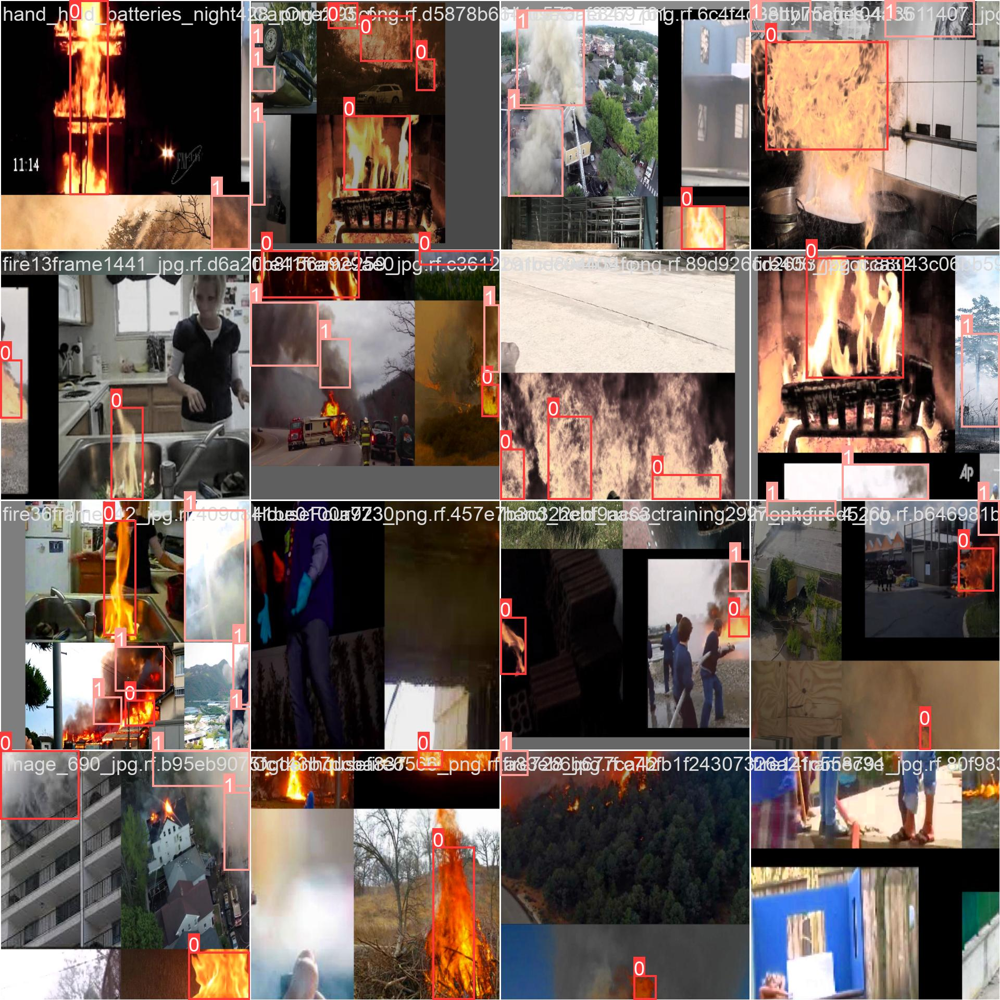

In [13]:
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/exp/train_batch0.jpg', width=900)

In [14]:
!python val.py --weights runs/train/exp/weights/best.pt --data data/wildfire.yaml


val: data=data/wildfire.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-411-gf4d8a84c Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolov5/data/wildfire_dataset/val/labels.cache... 728 images, 1 backgrounds, 0 corrupt: 100% 728/728 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 23/23 [00:12<00:00,  1.87it/s]
                   all        728       1524      0.574      0.576      0.566       0.25
                  fire        728        908       0.64      0.695      0.685      0.326
                 

GROUND TRUTH AUGMENTED VAL DATA:


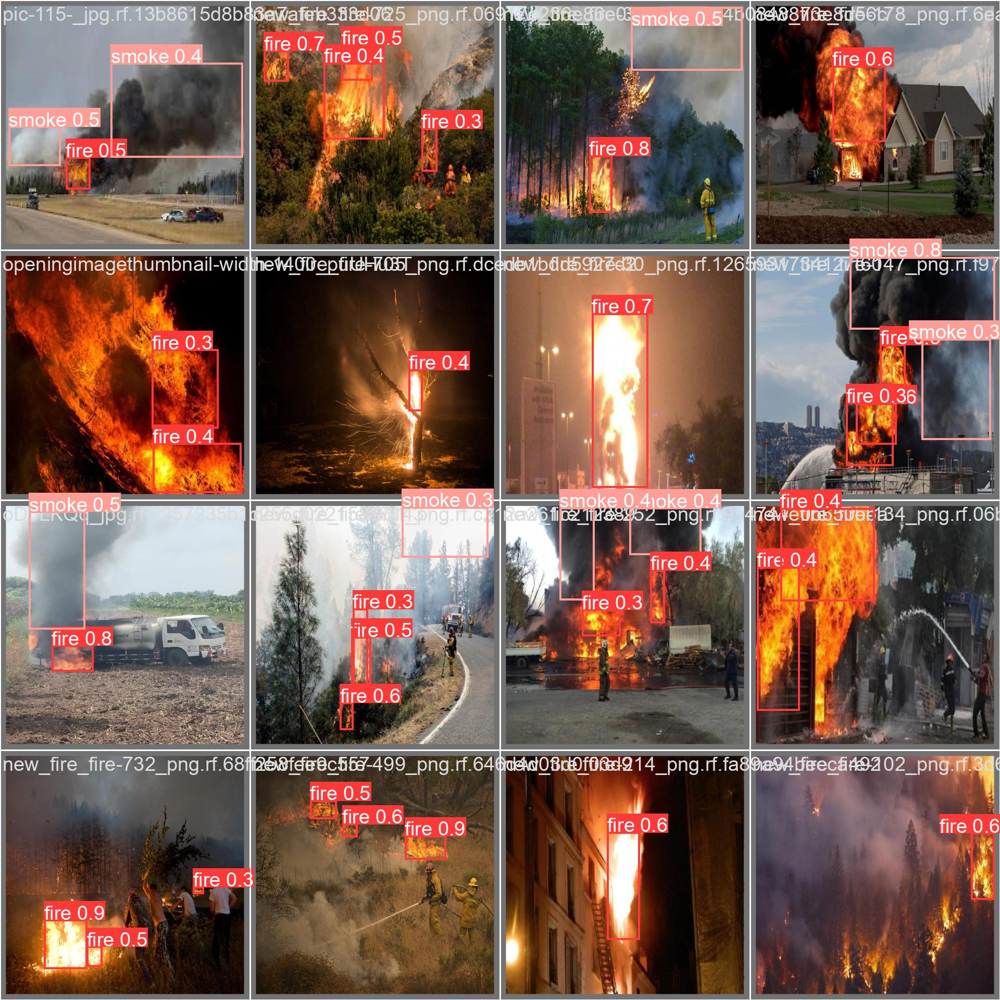

In [15]:
print("GROUND TRUTH AUGMENTED VAL DATA:")
Image(filename='/content/yolov5/runs/val/exp/val_batch0_pred.jpg', width=900)

CONFUSION MATRIX:


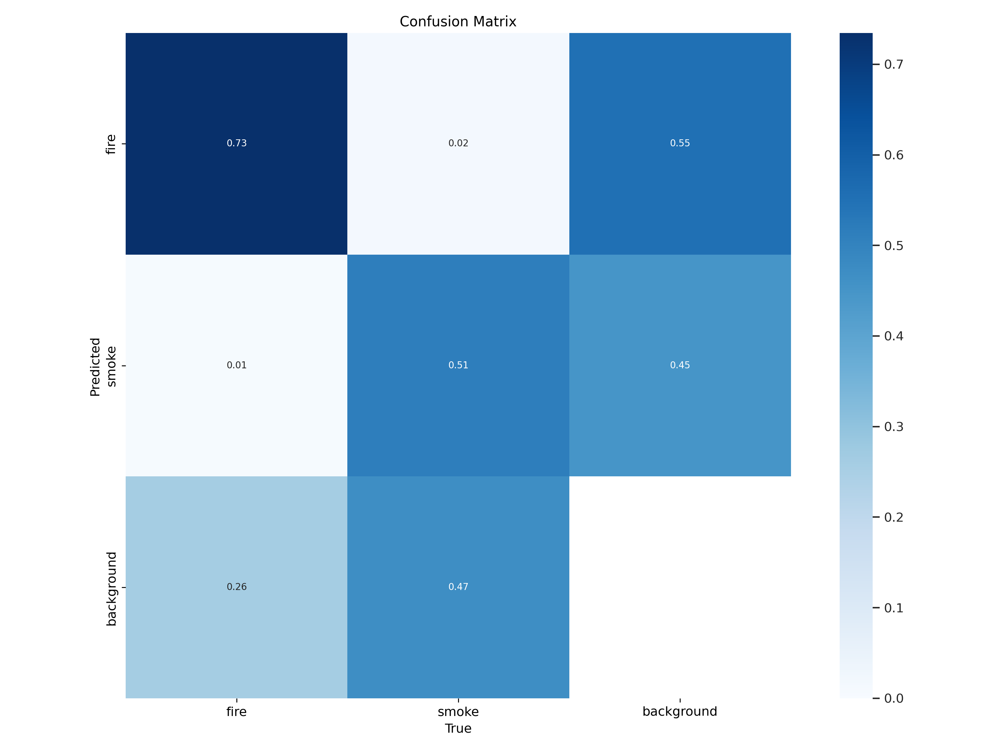

In [16]:
print("CONFUSION MATRIX:")
Image(filename='/content/yolov5/runs/train/exp/confusion_matrix.png', width=900)

In [23]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source /content/yolov5/data/wildfire_dataset/test/images


detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/data/wildfire_dataset/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-411-gf4d8a84c Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/452 /content/yolov5/data/wildfire_dataset/test/images/00271_jpg.rf.855daa53cdf70bb1ca89c238c9a9ee8a.jpg: 640x640 4 smokes, 11.4ms
image 2/452 /content/yolov5/data/wildfire_dataset/test/images/00388_jpg.rf.4e0c55102c9c2a908dd0e53bf71902e5.jpg: 640x640 1 smoke, 11.5ms
image 3/45

In [ ]:
#Displaying interference on all images

import glob
from IPython.display import Image,display



TESTING IMAGE: 


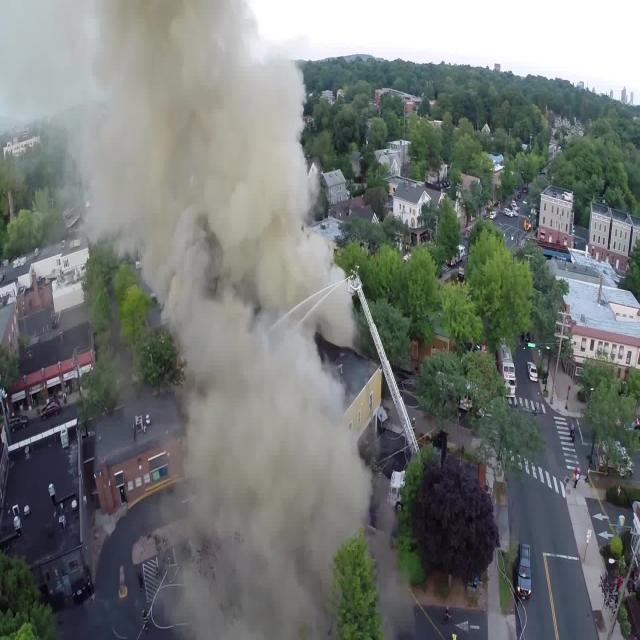

In [29]:
#Testing Results
print("TESTING IMAGE: ")
Image(filename='/content/yolov5/data/wildfire_dataset/test/images/00271_jpg.rf.855daa53cdf70bb1ca89c238c9a9ee8a.jpg', width=900)

RESULT OF THE TESTING IMAGE: 


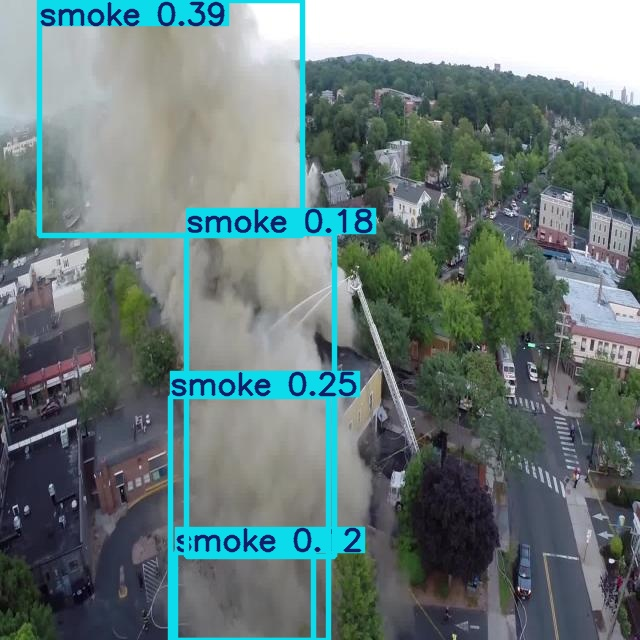

In [30]:
print("RESULT OF THE TESTING IMAGE: ")
Image(filename='/content/yolov5/runs/detect/exp4/00271_jpg.rf.855daa53cdf70bb1ca89c238c9a9ee8a.jpg', width=900)

In [32]:
from google.colab import files
files.download('/content/yolov5/runs/train/exp/weights/best.pt')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>